In [ ]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
from scipy import stats

from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import LabelEncoder

%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
training_data_raw = pd.read_csv("/content/drive/My Drive/WiDS Datathon 2020/training_v2.csv")
unlabeled_data_raw = pd.read_csv("/content/drive/My Drive/WiDS Datathon 2020/unlabeled.csv")

In [ ]:
 df = training_data_raw

In [ ]:
print([c for c in df.columns if (1<df[c].nunique()) & (df[c].dtype != np.number)& (df[c].dtype != int) ])

['ethnicity', 'gender', 'hospital_admit_source', 'icu_admit_source', 'icu_stay_type', 'icu_type', 'apache_3j_bodysystem', 'apache_2_bodysystem']


In [ ]:
categorical_cols =  ['hospital_id','ethnicity', 'gender', 'hospital_admit_source', 'icu_admit_source', 'icu_stay_type', 'icu_type', 'apache_3j_bodysystem', 'apache_2_bodysystem',"hospital_death","d1_heartrate_min" ,"d1_lactate_min","d1_resprate_min"]

In [ ]:
Categorical_df= df[categorical_cols]
Categorical_df.head(5)

,hospital_id,ethnicity,gender,hospital_admit_source,icu_admit_source,icu_stay_type,icu_type,apache_3j_bodysystem,apache_2_bodysystem,hospital_death,d1_heartrate_min,d1_lactate_min,d1_resprate_min
0,118,Caucasian,M,Floor,Floor,admit,CTICU,Sepsis,Cardiovascular,0,72.0,1.0,10.0
1,81,Caucasian,F,Floor,Floor,admit,Med-Surg ICU,Respiratory,Respiratory,0,72.0,3.5,12.0
2,118,Caucasian,F,Emergency Department,Accident & Emergency,admit,Med-Surg ICU,Metabolic,Metabolic,0,68.0,NaN,8.0
3,118,Caucasian,F,Operating Room,Operating Room / Recovery,admit,CTICU,Cardiovascular,Cardiovascular,0,92.0,NaN,7.0
4,33,Caucasian,M,NaN,Accident & Emergency,admit,Med-Surg ICU,Trauma,Trauma,0,60.0,NaN,16.0


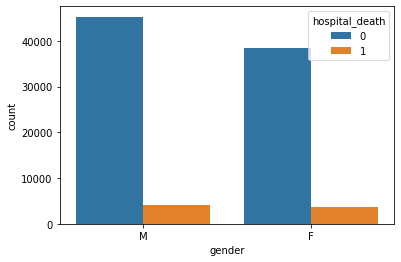

In [ ]:
sns.countplot(data = Categorical_df, x = 'gender',hue ='hospital_death')

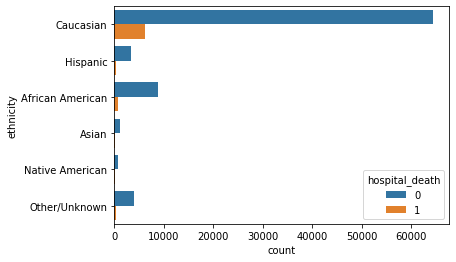

In [ ]:
sns.countplot(y="ethnicity", hue="hospital_death" , data=Categorical_df);

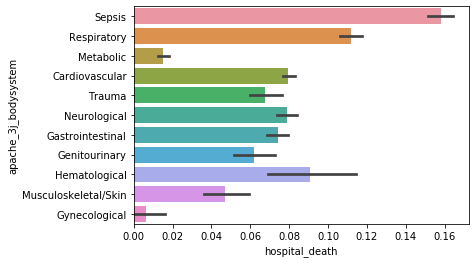

In [ ]:
sns.barplot(y="apache_3j_bodysystem", x="hospital_death" , data=Categorical_df);

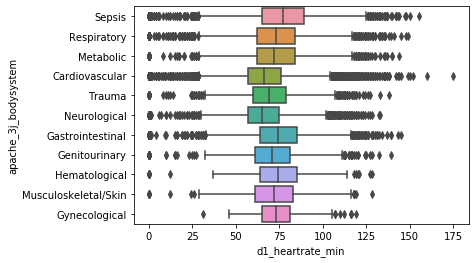

In [ ]:
sns.boxplot(x="d1_heartrate_min", y="apache_3j_bodysystem" , data=Categorical_df);

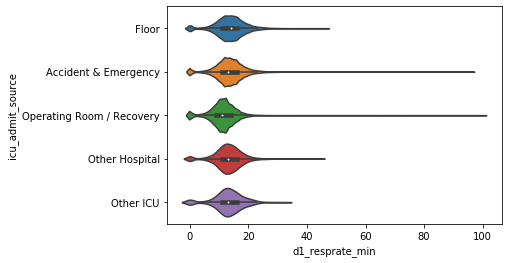

In [ ]:
sns.violinplot(x="d1_resprate_min", y="icu_admit_source" , data=Categorical_df);

In [ ]:
from google.colab import files
uploaded = files.upload()

In [ ]:
import scipy
import matplotlib

((array([-4.32699828, -4.1273899 , -4.01879124, ...,  4.01879124,
          4.1273899 ,  4.32699828]),
  array([0.1, 0.1, 0.1, ..., nan, nan, nan])),
 (nan, nan, nan))

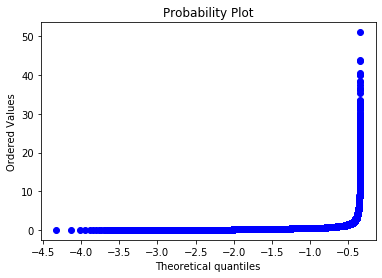

In [ ]:
scipy.stats.probplot(training_data_raw['bilirubin_apache'], dist="norm", plot=matplotlib.pyplot)

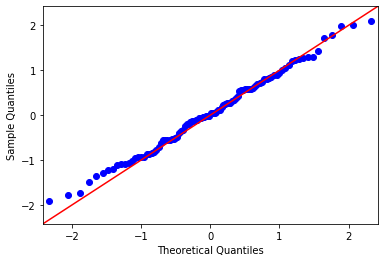

In [ ]:
import numpy as np 
import statsmodels.api as sm 
import pylab as py 

# np.random generates different random numbers 
# whenever the code is executed 
# Note: When you execute the same code 
# the graph look different than shown below. 

# Random data points generated 
data_points = np.random.normal(0, 1, 100)	 

sm.qqplot(data_points, line ='45') 
py.show() 

In [ ]:
qqplot(training_data_raw, x="bilirubin_apache", y="bun_apache")

NameError: ignored

In [ ]:
training_data_raw

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,...,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.730000,0,Caucasian,M,180.3,Floor,Floor,92,admit,CTICU,0.541667,0,73.9,2.3,113.0,502.01,0,0.0,0.4,31.0,2.51,NaN,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0.0,40.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.10,0.05,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.420000,0,Caucasian,F,160.0,Floor,Floor,90,admit,Med-Surg ICU,0.927778,0,70.2,NaN,108.0,203.01,0,0.0,NaN,9.0,0.56,1.0,1.0,3.0,0.0,1.0,145.0,120.0,36.9,0.0,46.0,37.0,37.0,51.0,7.45,...,1.3,1.3,3.5,3.5,557.0,557.0,4.2,4.2,145.0,145.0,12.70,12.70,37.0,37.0,7.45,7.45,51.0,51.0,54.8,51.000000,37.0,37.000,7.45,7.45,51.0,51.0,51.0,51.0,0.47,0.29,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,119783,50777,118,0,25.0,31.950000,0,Caucasian,F,172.7,Emergency Department,Accident & Emergency,93,admit,Med-Surg ICU,0.000694,0,95.3,NaN,122.0,703.03,0,0.0,NaN,NaN,NaN,NaN,3.0,6.0,0.0,5.0,NaN,102.0,NaN,0.0,68.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,79267,46918,118,0,81.0,22.640000,1,Caucasian,F,165.1,Operating Room,Operating Room / Recovery,92,admit,CTICU,0.000694,0,61.7,NaN,203.0,1206.03,1,0.0,NaN,NaN,NaN,0.6,4.0,6.0,0.0,5.0,185.0,114.0,25.9,1.0,60.0,30.0,30.0,142.0,7.39,...,1.6,1.1,NaN,NaN,43.0,43.0,NaN,NaN,NaN,NaN,8.80,8.80,37.0,27.0,7.44,7.34,337.0,102.0,342.5,236.666667,36.0,33.000,7.37,7.34,337.0,265.0,337.0,337.0,0.04,0.03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
4,92056,34377,33,0,19.0,NaN,0,Caucasian,M,188.0,NaN,Accident & Emergency,91,admit,Med-Surg ICU,0.073611,0,NaN,NaN,119.0,601.01,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.0,NaN,0.0,103.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91708,91592,78108,30,0,75.0,23.060250,0,Caucasian,M,177.8,Acute Care/Floor,Floor,927,admit,Cardiac ICU,0.298611,0,72.9,NaN,113.0,501.06,0,0.0,NaN,NaN,NaN,NaN,4.0,6.0,0.0,5.0,381.0,115.0,NaN,0.0,48.0,NaN,NaN,NaN,NaN,...,1.1,1.1,NaN,NaN,92.0,92.0,4.2,4.2,140.0,140.0,5.68,5.68,48.0,48.0,7.34,7.34,144.0,144.0,NaN,NaN,48.0,48.000,7.34,7.34,144.0,144.0,NaN,NaN,0.12,0.05,0

In [ ]:
#record any objective data into categorical 
col_list = list(training_data_raw.columns)

#for i in col_list:
  #print(i)
  #print(training_data_raw[i].dtypes)
#if training_data[i].dtypes == 'object':
  #training_data[i] = pd.Categorical(training_data[i]).codes
  #training_data[i] = training_data[i].replace(-1, np.nan)
  
#training_data.head(100)
#missing values = -1 need to recode the missing values

In [ ]:
descriptive_table = pd.DataFrame()

for c in col_list[3:]:
  #print(c)
  description = pd.DataFrame(training_data_raw.loc[training_data_raw ['hospital_death']== 0 , c].describe().reset_index())
  #print(description)
  description.columns = ['Stats', 'Values']
  description['variable'] = c
  descriptive_table = descriptive_table.append(description)
  #print(description)

descriptive_table.head()

,Stats,Values,variable
0,count,83798,hospital_death
1,mean,0,hospital_death
2,std,0,hospital_death
3,min,0,hospital_death
4,25%,0,hospital_death


In [ ]:
descriptive_table.loc[descriptive_table['variable'].isin(['h1_resprate_max'])]

,Stats,Values,variable
0,count,79780,h1_resprate_max
1,mean,22.3512,h1_resprate_max
2,std,7.35474,h1_resprate_max
3,min,10,h1_resprate_max
4,25%,18,h1_resprate_max
5,50%,21,h1_resprate_max
6,75%,26,h1_resprate_max
7,max,59,h1_resprate_max


In [ ]:
training_data_raw[['albumin_apache', 'd1_albumin_max', 'd1_albumin_min', 'h1_albumin_max', 'h1_albumin_min']].describe()

,albumin_apache,d1_albumin_max,d1_albumin_min,h1_albumin_max,h1_albumin_min
count,37334.000000,42617.000000,42617.000000,7889.000000,7889.000000
mean,2.902968,2.968332,2.900007,3.030080,3.029078
std,0.681863,0.668939,0.671195,0.731651,0.731677
min,1.200000,1.200000,1.100000,1.100000,1.100000
25%,2.400000,2.500000,2.400000,2.500000,2.500000
50%,2.900000,3.000000,2.900000,3.100000,3.100000
75%,3.400000,3.400000,3.400000,3.600000,3.600000
max,4.600000,4.600000,4.500000,4.700000,4.700000


In [ ]:
freq_table = pd.DataFrame()

for c in col_list[3:]:
  #print(c)
  freq = pd.DataFrame(training_data_raw[c].value_counts(dropna = False, normalize = True).reset_index())
  freq.columns = ['Value', 'Percentage']
  freq['variable'] = c
  #print(freq)
  freq_table = freq_table.append(freq)

freq_table.head()

,Value,Percentage,variable
0,0,0.913698,hospital_death
1,1,0.086302,hospital_death
0,NaN,0.046100,age
1,67,0.024762,age
2,68,0.023693,age


In [ ]:
freq_table.loc[freq_table['variable']=='ethnicity']

,Value,Percentage,variable
0,Caucasian,0.770709,ethnicity
1,African American,0.104096,ethnicity
2,Other/Unknown,0.047692,ethnicity
3,Hispanic,0.041390,ethnicity
4,NaN,0.015210,ethnicity
5,Asian,0.012310,ethnicity
6,Native American,0.008592,ethnicity


In [ ]:
#download data - in downloads
from google.colab import files
freq_table.to_csv("freq_table.csv")
files.download("freq_table.csv")

In [ ]:
#download data - in downloads
from google.colab import files
descriptive_table.to_csv("descriptive_table.csv")
files.download("descriptive_table.csv")

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fee1c11d0b8>,
      dtype=object)

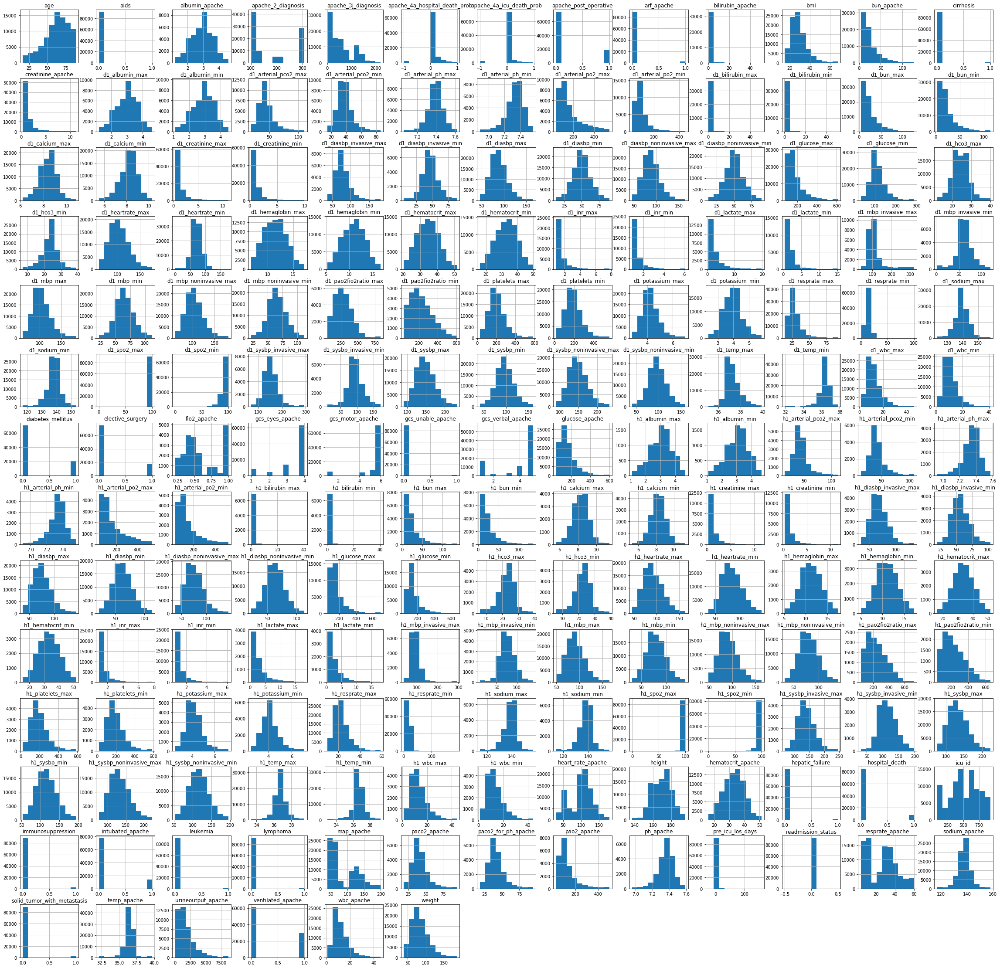

In [ ]:
training_data_raw[col_list[3:]].hist(figsize = (40, 40))

In [ ]:
corr_matrix = training_data_raw[col_list[3:]].corr()
corr_matrix.style.background_gradient(cmap = 'coolwarm', axis = None)

/usr/local/lib/python3.6/dist-packages/matplotlib/colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


In [ ]:
# creating independent features X and dependant feature Y
y = training_data_raw['hospital_death']
X = training_data_raw.copy()
X = training_data_raw.drop('hospital_death',axis = 1)
X1 = training_data_raw.drop('hospital_death',axis = 1)

In [ ]:
# Threshold for removing correlated variables
threshold = 0.9

# Absolute value correlation matrix
corr_matrix = X.corr().abs()
corr_matrix.head()

,encounter_id,patient_id,hospital_id,age,bmi,elective_surgery,height,icu_id,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,...,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
encounter_id,1.000000,0.009575,0.004532,0.003990,0.001068,0.002036,0.005400,0.000992,0.000570,NaN,0.004376,0.006262,0.000113,0.000651,0.001138,0.007920,0.002198,0.002619,0.005435,0.000824,0.003276,0.007664,0.002400,0.006516,0.002108,0.001718,0.001566,0.003172,0.000759,0.015002,0.015002,0.001088,0.005632,0.006498,0.007004,0.005162,0.009225,0.005775,0.009363,0.013306,...,0.000730,0.001471,0.006878,0.005783,0.009662,0.008953,0.003963,0.003424,0.003539,0.005155,0.011436,0.012609,0.002501,0.002825,0.010535,0.011311,0.006958,0.002549,0.003484,0.002009,0.003615,0.001315,0.002119,0.002069,0.000875,0.001810,0.007370,0.005074,0.007282,0.006597,0.000513,0.000344,0.001907,0.007601,0.003402,0.000972,0.001707,0.002172,0.001176,0.004646
patient_id,0.009575,1.000000,0.007075,0.006343,0.001380,0.001387,0.002902,0.001770,0.004412,NaN,0.000275,0.001534,0.001539,0.004215,0.002260,0.003980,0.004292,0.002860,0.004134,0.003811,0.001551,0.002216,0.006673,0.000471,0.000270,0.004735,0.002944,0.001303,0.002413,0.006433,0.006433,0.001393,0.006994,0.000179,0.011433,0.002535,0.006058,0.004433,0.002185,0.003669,...,0.012551,0.012819,0.004313,0.001757,0.011325,0.011179,0.004455,0.004550,0.009513,0.010086,0.000044,0.000180,0.000606,0.000672,0.000999,0.006809,0.000683,0.004415,0.001944,0.003621,0.006064,0.006501,0.003925,0.006113,0.003661,0.003633,0.001242,0.001541,0.000220,0.003382,0.003735,0.001625,0.002426,0.001307,0.000434,0.001667,0.000548,0.000844,0.002333,0.003065
hospital_id,0.004532,0.007075,1.000000,0.008673,0.012874,0.052123,0.027895,0.004526,0.001285,NaN,0.026314,0.011685,0.006806,0.031896,0.053985,0.000844,0.017921,0.014084,0.001126,0.014941,0.011727,0.020512,0.017576,0.002954,0.000057,0.007649,0.002436,0.027670,0.001011,0.020200,0.020200,0.006726,0.013026,0.023262,0.001482,0.033490,0.049851,0.030761,0.006752,0.007217,...,0.021403,0.018969,0.002463,0.007411,0.000334,0.006328,0.032203,0.030355,0.012734,0.023798,0.032732,0.025685,0.012899,0.012030,0.001688,0.016839,0.025894,0.000762,0.018122,0.005636,0.021170,0.014118,0.016317,0.021915,0.016632,0.010328,0.012004,0.029556,0.011965,0.018974,0.006993,0.000283,0.004947,0.002962,0.011978,0.001362,0.000146,0.002992,0.002588,0.004730
age,0.003990,0.006343,0.008673,1.000000,0.087077,0.067320,0.109937,0.024257,0.049872,NaN,0.127252,0.116633,0.022914,0.056060,0.059246,0.001684,0.044981,0.237187,0.056178,0.037935,0.026363,0.025843,0.007754,0.017829,0.007043,0.149495,0.118853,0.015396,0.015870,0.033000,0.033000,0.020300,0.046525,0.037328,0.037734,0.082265,0.176577,0.041296,0.010786,0.190410,...,0.120492,0.123719,0.107346,0.118262,0.007298,0.004765,0.103959,0.104354,0.041772,0.038608,0.029323,0.026215,0.052662,0.051740,0.041012,0.056249,0.047509,0.055960,

In [ ]:
# Upper triangle of correlations
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
upper.head()
# Select columns with correlations above threshold
to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
print('There are %d columns to remove.' % (len(to_drop)))
#Drop the columns with high correlations
X = X.drop(columns = to_drop)

There are 59 columns to remove.


In [ ]:
# Train missing values (in percent)
train_missing = (X.isnull().sum() / len(X)).sort_values(ascending = False)
train_missing.head()
train_missing = train_missing.index[train_missing > 0.75]
print('There are %d columns with more than 75%% missing values' % len(train_missing))
X = X.drop(columns = train_missing)

There are 18 columns with more than 75% missing values


In [ ]:
#Convert categorical variable into dummy/indicator variables.
X = pd.get_dummies(X)

In [ ]:
died_training = training_data_raw.loc[training_data_raw['hospital_death'] == 1]
alive_training = training_data_raw.loc[training_data_raw['hospital_death'] == 0]

In [ ]:
ratio =  0.80
X = training_data_raw
list_of_num_features = data_dict[data_dict['Data Type'].isin(['numeric','integer'])]['Variable Name'].tolist()
list_of_num_features = list_of_num_features[:-1]
list_of_num_features.append('bmi')
pd.to_numeric(X['bmi'], errors ='coerce')


# Remove Features with more than 80 percent missing values
ratio =  0.80
X = training_data_raw
train_missing = (X.isnull().sum() / len(X)).sort_values(ascending = False)
train_missing = train_missing.index[train_missing > ratio].tolist()
train_missing
X_dropped = X.drop(train_missing, axis=1)

NameError: ignored